In [1]:
import os, glob, urllib.request, tarfile
import numpy as np
from PIL import Image
import torch, torch.nn as nn, torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
from sklearn.feature_extraction import image as ski_image
from sklearn.neighbors import NearestNeighbors
from scipy.ndimage import uniform_filter

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
os.makedirs('data', exist_ok=True)
os.makedirs('outputs', exist_ok=True)

Using device: cpu


In [2]:
def download_and_load_data():
    """Download BSDS300 dataset and load images"""
    bsds_url = 'https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300-images.tgz'
    tgz_path = 'data/BSDS300-images.tgz'
    
    if not os.path.exists(tgz_path):
        print('Downloading BSDS300...')
        urllib.request.urlretrieve(bsds_url, tgz_path)
        with tarfile.open(tgz_path, 'r:gz') as tar:
            tar.extractall(path='data')
    
    def load_images_from_folder(folder, max_images=None):
        paths = glob.glob(folder + '/**/*.jpg', recursive=True)
        imgs = []
        for i, p in enumerate(sorted(paths)):
            if max_images and i >= max_images:
                break
            img = np.array(Image.open(p).convert('RGB'), dtype=np.float32) / 255.0
            if img.shape[0] > 256 or img.shape[1] > 256:
                img = np.array(Image.fromarray((img * 255).astype(np.uint8)).resize((256, 256))) / 255.0
            imgs.append(img)
        return imgs
    
    train_imgs = load_images_from_folder('data/BSDS300/images/train', max_images=100) 
    val_imgs = load_images_from_folder('data/BSDS300/images/test', max_images=20) 
    print(f'Loaded {len(train_imgs)} train and {len(val_imgs)} val images.')
    return train_imgs, val_imgs

# Load the data
train_imgs, val_imgs = download_and_load_data()

C:\Users\Rohin's Laptop\AppData\Local\Temp\ipykernel_24020\265570249.py:10: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path='data')


Loaded 100 train and 20 val images.


In [4]:
def add_awgn(img, sigma=25):
    """Add Additive White Gaussian Noise"""
    s = sigma / 255.0
    noisy = img + np.random.normal(0, s, img.shape)
    return np.clip(noisy, 0, 1)

def extract_patches_with_positions(img, patch_size=16, stride=8):
    """Extract overlapping patches with their positions for reconstruction"""
    h, w, c = img.shape
    patches = []
    positions = []
    
    for i in range(0, h - patch_size + 1, stride):
        for j in range(0, w - patch_size + 1, stride):
            patch = img[i:i+patch_size, j:j+patch_size]
            patches.append(patch)
            positions.append((i, j))
    
    return np.array(patches), positions

def reconstruct_from_patches(patches, positions, img_shape, patch_size=16, stride=8):
    """Reconstruct image from overlapping patches using weighted averaging"""
    h, w, c = img_shape
    reconstructed = np.zeros((h, w, c), dtype=np.float32)
    weights = np.zeros((h, w), dtype=np.float32)
    
    weight_mask = np.ones((patch_size, patch_size))
    for i in range(patch_size):
        for j in range(patch_size):
            di = min(i, patch_size - 1 - i)
            dj = min(j, patch_size - 1 - j)
            weight_mask[i, j] = min(di, dj) + 1
    weight_mask = weight_mask / np.max(weight_mask)
    
    for patch, (i, j) in zip(patches, positions):
        end_i, end_j = min(i + patch_size, h), min(j + patch_size, w)
        patch_h, patch_w = end_i - i, end_j - j
        
        reconstructed[i:end_i, j:end_j] += patch[:patch_h, :patch_w] * weight_mask[:patch_h, :patch_w, np.newaxis]
        weights[i:end_i, j:end_j] += weight_mask[:patch_h, :patch_w]
    
    weights[weights == 0] = 1
    reconstructed = reconstructed / weights[:, :, np.newaxis]
    return np.clip(reconstructed, 0, 1)

def psnr(img1, img2):
    """Calculate Peak Signal-to-Noise Ratio"""
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100.0
    return 20 * np.log10(1.0 / np.sqrt(mse))

test_img = train_imgs[0]
noisy_test = add_awgn(test_img)
patches, positions = extract_patches_with_positions(test_img, patch_size=32, stride=16)
reconstructed = reconstruct_from_patches(patches, positions, test_img.shape, patch_size=32, stride=16)

print(f"Original image shape: {test_img.shape}")
print(f"Number of patches extracted: {len(patches)}")
print(f"Reconstruction PSNR (should be very high): {psnr(test_img, reconstructed):.2f} dB")

Original image shape: (256, 256, 3)
Number of patches extracted: 225
Reconstruction PSNR (should be very high): 155.04 dB


In [5]:
class SimpleEncoder(nn.Module):
    """Simplified encoder without complex attention/residual blocks"""
    def __init__(self, patch_size=16, n_bins=64):
        super().__init__()
        self.patch_size = patch_size
        
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d(1)
        )
        
        self.distribution_head = nn.Sequential(
            nn.Linear(64, n_bins),
            nn.Softmax(dim=-1)
        )
        
    def forward(self, x):
        features = self.conv_layers(x).squeeze(-1).squeeze(-1)
        probs = self.distribution_head(features)
        
        return probs, features

class SimpleReconHead(nn.Module):
    """Simplified reconstruction head"""
    def __init__(self, feat_dim=64, patch_size=16):
        super().__init__()
        self.patch_size = patch_size
        
        self.upsample = nn.Sequential(
            nn.Linear(feat_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, 3 * patch_size * patch_size),
            nn.Sigmoid()
        )
        
    def forward(self, features):
        batch_size = features.size(0)
        recon = self.upsample(features)
        return recon.view(batch_size, 3, self.patch_size, self.patch_size)

class GraphCurvaturePredictor(nn.Module):
    """Simplified curvature predictor"""
    def __init__(self, n_bins=64, hidden=64):
        super().__init__()
        
        self.node_processor = nn.Sequential(
            nn.Linear(n_bins, hidden),
            nn.ReLU()
        )
        
        self.edge_processor = nn.Sequential(
            nn.Linear(hidden * 2 + 1, hidden),  # concatenated node features + edge weight
            nn.ReLU(),
            nn.Linear(hidden, 1)
        )
        
    def forward(self, hi, hj, w):
        hi_processed = self.node_processor(hi)
        hj_processed = self.node_processor(hj)
        
        edge_feat = torch.cat([hi_processed, hj_processed, w.unsqueeze(-1)], dim=-1)
        
        curvature = self.edge_processor(edge_feat)
        return curvature.squeeze(-1)

patch_size = 32
n_bins = 64
feat_dim = 64

encoder = SimpleEncoder(patch_size=patch_size, n_bins=n_bins).to(device)
recon_head = SimpleReconHead(feat_dim=feat_dim, patch_size=patch_size).to(device)
curvnet = GraphCurvaturePredictor(n_bins=n_bins, hidden=64).to(device)

test_patches = torch.randn(4, 3, patch_size, patch_size).to(device)
probs, features = encoder(test_patches)
recon = recon_head(features)

print(f"Input shape: {test_patches.shape}")
print(f"Probability distribution shape: {probs.shape}")
print(f"Features shape: {features.shape}")
print(f"Reconstruction shape: {recon.shape}")
print(f"Encoder parameters: {sum(p.numel() for p in encoder.parameters()):,}")
print(f"Reconstruction head parameters: {sum(p.numel() for p in recon_head.parameters()):,}")
print(f"Curvature predictor parameters: {sum(p.numel() for p in curvnet.parameters()):,}")

Input shape: torch.Size([4, 3, 32, 32])
Probability distribution shape: torch.Size([4, 64])
Features shape: torch.Size([4, 64])
Reconstruction shape: torch.Size([4, 3, 32, 32])
Encoder parameters: 23,552
Reconstruction head parameters: 830,848
Curvature predictor parameters: 12,545


In [6]:
def build_better_graph(probs, spatial_positions, k=12, spatial_sigma=0.1, feature_sigma=0.1):
    """Build graph with both feature similarity and spatial proximity"""
    n = probs.shape[0]
    
    sqrt_probs = np.sqrt(probs)
    
    feature_nbrs = NearestNeighbors(n_neighbors=min(k*2, n), metric='euclidean').fit(sqrt_probs)
    feature_dists, feature_indices = feature_nbrs.kneighbors(sqrt_probs)
    
    spatial_nbrs = NearestNeighbors(n_neighbors=min(k, n), metric='euclidean').fit(spatial_positions)
    spatial_dists, spatial_indices = spatial_nbrs.kneighbors(spatial_positions)
    
    edges = []
    weights = {}
    
    for i in range(n):
        valid_neighbors = set(spatial_indices[i]) & set(feature_indices[i])
        
        for j in valid_neighbors:
            if i == j:
                continue
                
            spatial_d = spatial_dists[i, np.where(spatial_indices[i] == j)[0][0]]
            feature_d = feature_dists[i, np.where(feature_indices[i] == j)[0][0]]
            
            w = (np.exp(-spatial_d/spatial_sigma) + np.exp(-feature_d/feature_sigma)) / 2
            
            if (i, j) not in weights and (j, i) not in weights:
                edges.append((i, j))
                weights[(i, j)] = w
    
    return edges, weights

def efficient_sinkhorn(a, b, M, reg=0.05, numItermax=100, tol=1e-6):
    """More efficient Sinkhorn algorithm with early stopping"""
    K = np.exp(-M / reg)
    u = np.ones_like(a)
    
    for iteration in range(numItermax):
        u_prev = u.copy()
        v = b / (K.T.dot(u) + 1e-12)
        u = a / (K.dot(v) + 1e-12)
        
        if iteration > 10 and np.max(np.abs(u - u_prev)) < tol:
            break
    
    Pi = np.outer(u, v) * K
    cost = np.sum(Pi * M)
    return cost, Pi

def compute_ollivier_ricci_curvature(i, j, edges, weights, probs, neigh_map, reg=0.05):
    """Compute Ollivier-Ricci curvature with better numerical stability"""
    try:
        Ni = neigh_map.get(i, [i])  
        Nj = neigh_map.get(j, [j])
        
        mu_i = np.array([weights.get((i, nb), weights.get((nb, i), 1e-6)) for nb in Ni], dtype=np.float64)
        mu_j = np.array([weights.get((j, nb), weights.get((nb, j), 1e-6)) for nb in Nj], dtype=np.float64)
        
        mu_i = mu_i / (mu_i.sum() + 1e-12)
        mu_j = mu_j / (mu_j.sum() + 1e-12)
        
        M = np.zeros((len(Ni), len(Nj)))
        for ii, u in enumerate(Ni):
            for jj, v in enumerate(Nj):
                M[ii, jj] = np.linalg.norm(np.sqrt(probs[u]) - np.sqrt(probs[v]))
        
        W1, _ = efficient_sinkhorn(mu_i, mu_j, M, reg=reg, numItermax=100)
        
        d_graph = 1.0  
        kappa = 1 - (W1 / (d_graph + 1e-12))
        
        return np.clip(kappa, -2.0, 2.0)  
        
    except Exception:
        return 0.0


test_probs = np.random.dirichlet(np.ones(n_bins), size=20)  
test_positions = np.random.rand(20, 2)  

edges, weights = build_better_graph(test_probs, test_positions, k=5, spatial_sigma=0.1, feature_sigma=0.1)


neigh_map = {}
for (i, j) in edges:
    neigh_map.setdefault(i, []).append(j)
    neigh_map.setdefault(j, []).append(i)

print(f"Created graph with {len(edges)} edges for {len(test_probs)} nodes")
print(f"Average degree: {2 * len(edges) / len(test_probs):.2f}")


if edges:
    test_edge = edges[0]
    curvature = compute_ollivier_ricci_curvature(
        test_edge[0], test_edge[1], edges, weights, test_probs, neigh_map
    )
    print(f"Sample curvature for edge {test_edge}: {curvature:.4f}")

Created graph with 31 edges for 20 nodes
Average degree: 3.10
Sample curvature for edge (0, np.int64(9)): 0.4488


In [7]:
# Configuration parameters
config = {
    'patch_size': 32,
    'stride': 16,
    'n_bins': 64,
    'feat_dim': 64,
    'curv_hidden': 64,
    'k_neighbors': 12,
    'spatial_sigma': 0.1,
    'feature_sigma': 0.1,
    'sinkhorn_reg': 0.05,
    'max_curv_edges': 50,  
    'noise_sigma': 99,
    'beta': 0.01,  
    'lr_main': 1e-3,
    'lr_curv': 5e-4,
    'epochs': 60,
    'batch_size': 32
}

print("Training Configuration:")
for key, value in config.items():
    print(f"  {key}: {value}")

Training Configuration:
  patch_size: 32
  stride: 16
  n_bins: 64
  feat_dim: 64
  curv_hidden: 64
  k_neighbors: 12
  spatial_sigma: 0.1
  feature_sigma: 0.1
  sinkhorn_reg: 0.05
  max_curv_edges: 50
  noise_sigma: 99
  beta: 0.01
  lr_main: 0.001
  lr_curv: 0.0005
  epochs: 60
  batch_size: 32


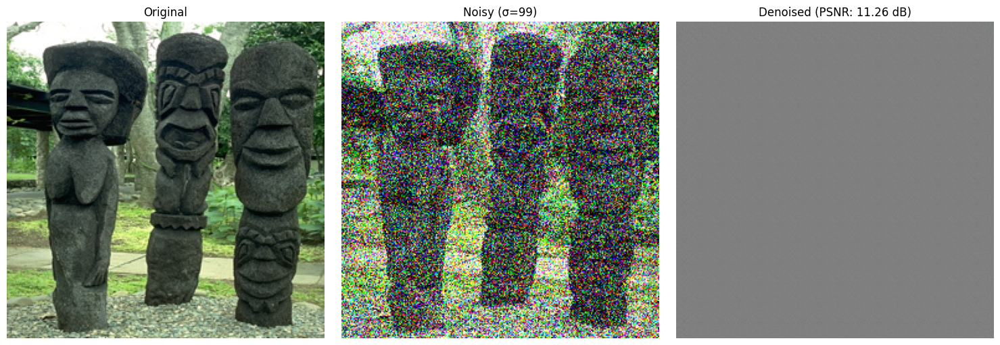

In [8]:
def visualize_results(encoder, recon_head, test_img, config, epoch):
    """Visualize denoising results"""
    encoder.eval()
    recon_head.eval()
    
    with torch.no_grad():
        noisy_img = add_awgn(test_img, sigma=config['noise_sigma'])
        
        noisy_patches, positions = extract_patches_with_positions(
            noisy_img, config['patch_size'], config['stride']
        )
        
        if len(noisy_patches) == 0:
            return
        
        batch_size = config['batch_size']
        denoised_patches = []
        
        for i in range(0, len(noisy_patches), batch_size):
            batch_patches = noisy_patches[i:i+batch_size]
            x_batch = torch.tensor(batch_patches, dtype=torch.float32).permute(0, 3, 1, 2).to(device)

            
            probs, features = encoder(x_batch)
            recon_batch = recon_head(features)
            
            denoised_patches.extend(recon_batch.cpu().numpy().transpose(0, 2, 3, 1))
        
        denoised_img = reconstruct_from_patches(
            denoised_patches, positions, test_img.shape, 
            config['patch_size'], config['stride']
        )
        
        # Create visualization
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        axes[0].imshow(test_img)
        axes[0].set_title('Original')
        axes[0].axis('off')
        
        axes[1].imshow(noisy_img)
        axes[1].set_title(f'Noisy (σ={config["noise_sigma"]})')
        axes[1].axis('off')
        
        axes[2].imshow(denoised_img)
        axes[2].set_title(f'Denoised (PSNR: {psnr(denoised_img, test_img):.2f} dB)')
        axes[2].axis('off')
        
        plt.tight_layout()
        plt.savefig(f'outputs/result_epoch_{epoch}.png', dpi=150, bbox_inches='tight')
        plt.show()
        
    return denoised_img

# Test visualization with untrained model
test_result = visualize_results(encoder, recon_head, val_imgs[0], config, 0)

In [16]:
def train_enhanced_drf_net(train_imgs, val_imgs, config):
    """Enhanced training with better optimization and monitoring"""
    
    # Initialize models
    encoder = SimpleEncoder(
        patch_size=config['patch_size'], 
        n_bins=config['n_bins']
    ).to(device)
    
    recon_head = SimpleReconHead(
        feat_dim=config['feat_dim'], 
        patch_size=config['patch_size']
    ).to(device)
    
    curvnet = GraphCurvaturePredictor(
        n_bins=config['n_bins'], 
        hidden=config['curv_hidden']
    ).to(device)
    
    optimizer_main = optim.AdamW(
        list(encoder.parameters()) + list(recon_head.parameters()), 
        lr=config['lr_main'], 
        weight_decay=1e-4
    )
    
    optimizer_curv = optim.AdamW(
        curvnet.parameters(), 
        lr=config['lr_curv'], 
        weight_decay=1e-4
    )
    
    scheduler_main = optim.lr_scheduler.CosineAnnealingLR(optimizer_main, T_max=config['epochs'])
    scheduler_curv = optim.lr_scheduler.CosineAnnealingLR(optimizer_curv, T_max=config['epochs'])
    
    criterion = nn.MSELoss()
    best_psnr = 0
    
    train_losses = []
    val_psnrs = []
    
    for epoch in range(config['epochs']):
        encoder.train()
        recon_head.train()
        curvnet.train()
        
        total_loss = 0.0
        total_recon_loss = 0.0
        total_curv_loss = 0.0
        
        for img_idx, img in enumerate(train_imgs):
            noisy = add_awgn(img, sigma=config['noise_sigma'])
            
            noisy_patches, positions = extract_patches_with_positions(
                noisy, config['patch_size'], config['stride']
            )
            clean_patches, _ = extract_patches_with_positions(
                img, config['patch_size'], config['stride']
            )
            
            if len(noisy_patches) == 0:
                continue
                
            x = torch.tensor(noisy_patches, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
            y = torch.tensor(clean_patches, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
            
            probs_torch, features = encoder(x)
            probs = probs_torch.detach().cpu().numpy()
            
            h, w, _ = img.shape
            normalized_positions = np.array([(p[0]/h, p[1]/w) for p in positions])
            
            edges, weights_dict = build_better_graph(
                probs, normalized_positions, 
                k=config['k_neighbors'], 
                spatial_sigma=config['spatial_sigma'],
                feature_sigma=config['feature_sigma']
            )
            
            neigh_map = {}
            for (i, j) in edges:
                neigh_map.setdefault(i, []).append(j)
                neigh_map.setdefault(j, []).append(i)
            
            max_edges = min(len(edges), config['max_curv_edges'])
            if max_edges > 0:
                chosen_indices = np.random.choice(len(edges), max_edges, replace=False)
                chosen_edges = [edges[i] for i in chosen_indices]
                
                curv_preds = []
                curv_targets = []
                
                for (i, j) in chosen_edges:
                    kappa_true = compute_ollivier_ricci_curvature(
                        i, j, edges, weights_dict, probs, neigh_map, reg=config['sinkhorn_reg']
                    )
                    
                    hi = probs_torch[i]
                    hj = probs_torch[j]
                    w = torch.tensor(weights_dict.get((i, j), weights_dict.get((j, i), 1e-6)), 
                                   dtype=torch.float32, device=device)
                    
                    pred_k = curvnet(hi, hj, w)
                    
                    curv_preds.append(pred_k)
                    curv_targets.append(torch.tensor(kappa_true, dtype=torch.float32, device=device))
                
                if curv_preds:
                    curv_preds = torch.stack(curv_preds)
                    curv_targets = torch.stack(curv_targets)
                    loss_curv = criterion(curv_preds, curv_targets)
                else:
                    loss_curv = torch.tensor(0.0, device=device)
            else:
                loss_curv = torch.tensor(0.0, device=device)
            
            recon = recon_head(features)
            loss_recon = criterion(recon, y)
            
            loss = loss_recon + config['beta'] * loss_curv
            
            optimizer_main.zero_grad()
            optimizer_curv.zero_grad()
            loss.backward()
            optimizer_main.step()
            optimizer_curv.step()
            
            total_loss += loss.item()
            total_recon_loss += loss_recon.item()
            total_curv_loss += loss_curv.item()
            
            if loss_curv.item() > 2 * loss_recon.item() and config['beta'] > 0.001:
                config['beta'] *= 0.9  # Reduce beta further
                print(f"Reducing beta to {config['beta']:.4f}")
        
        scheduler_main.step()
        scheduler_curv.step()
        
        encoder.eval()
        recon_head.eval()
        val_psnrs_epoch = []
        
        with torch.no_grad():
            for val_img in val_imgs[:5]:  
                noisy_val = add_awgn(val_img, sigma=config['noise_sigma'])
                
                noisy_patches, positions = extract_patches_with_positions(
                    noisy_val, config['patch_size'], config['stride']
                )
                
                if len(noisy_patches) == 0:
                    continue
                
                batch_size = config['batch_size']
                denoised_patches = []
                
                for i in range(0, len(noisy_patches), batch_size):
                    batch_patches = noisy_patches[i:i+batch_size]
                    x_batch = torch.tensor(batch_patches, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
                    
                    probs, features = encoder(x_batch)
                    recon_batch = recon_head(features)
                    
                    denoised_patches.extend(recon_batch.cpu().numpy().transpose(0, 2, 3, 1))
                
                denoised_img = reconstruct_from_patches(
                    denoised_patches, positions, val_img.shape, 
                    config['patch_size'], config['stride']
                )
                
                val_psnr = psnr(denoised_img, val_img)
                val_psnrs_epoch.append(val_psnr)
        
        avg_val_psnr = np.mean(val_psnrs_epoch) if val_psnrs_epoch else 0
        
        train_losses.append(total_loss)
        val_psnrs.append(avg_val_psnr)
        
        print(f"Epoch {epoch+1}/{config['epochs']} - "
              f"Loss: {total_loss:.4f} (Recon: {total_recon_loss:.4f}, Curv: {total_curv_loss:.4f}) - "
              f"Beta: {config['beta']:.4f} - "
              f"Val PSNR: {avg_val_psnr:.3f} dB")
        
        if avg_val_psnr > best_psnr:
            best_psnr = avg_val_psnr
            torch.save({
                'encoder': encoder.state_dict(),
                'recon_head': recon_head.state_dict(),
                'curvnet': curvnet.state_dict(),
                'epoch': epoch,
                'psnr': best_psnr,
                'config': config
            }, 'outputs/best_model.pt')
        
        if (epoch + 1) % 10 == 0 and val_imgs:
            visualize_results(encoder, recon_head, val_imgs[0], config, epoch + 1)
    
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.plot(train_losses)
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.plot(val_psnrs)
    plt.title('Validation PSNR')
    plt.xlabel('Epoch')
    plt.ylabel('PSNR (dB)')
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig('outputs/training_curves.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    return encoder, recon_head, curvnet, train_losses, val_psnrs

print("Training function defined. Ready to start training!")

Training function defined. Ready to start training!


Enhanced DRF-Net: Ricci Flow Curvature Regularized Denoising
Epoch 1/60 - Loss: 4.4495 (Recon: 4.4114, Curv: 38.6107) - Beta: 0.0010 - Val PSNR: 16.153 dB
Epoch 2/60 - Loss: 2.6063 (Recon: 2.6063, Curv: 0.0139) - Beta: 0.0010 - Val PSNR: 16.834 dB
Epoch 3/60 - Loss: 2.5243 (Recon: 2.5243, Curv: 0.0033) - Beta: 0.0010 - Val PSNR: 17.053 dB
Epoch 4/60 - Loss: 2.4864 (Recon: 2.4864, Curv: 0.0045) - Beta: 0.0010 - Val PSNR: 17.077 dB
Epoch 5/60 - Loss: 2.4253 (Recon: 2.4253, Curv: 0.0078) - Beta: 0.0010 - Val PSNR: 17.302 dB
Epoch 6/60 - Loss: 2.1717 (Recon: 2.1717, Curv: 0.0123) - Beta: 0.0010 - Val PSNR: 17.934 dB
Epoch 7/60 - Loss: 2.0824 (Recon: 2.0823, Curv: 0.0083) - Beta: 0.0010 - Val PSNR: 18.195 dB
Epoch 8/60 - Loss: 2.0346 (Recon: 2.0346, Curv: 0.0073) - Beta: 0.0010 - Val PSNR: 18.207 dB
Epoch 9/60 - Loss: 2.0253 (Recon: 2.0253, Curv: 0.0067) - Beta: 0.0010 - Val PSNR: 18.261 dB
Epoch 10/60 - Loss: 2.0245 (Recon: 2.0245, Curv: 0.0066) - Beta: 0.0010 - Val PSNR: 18.284 dB


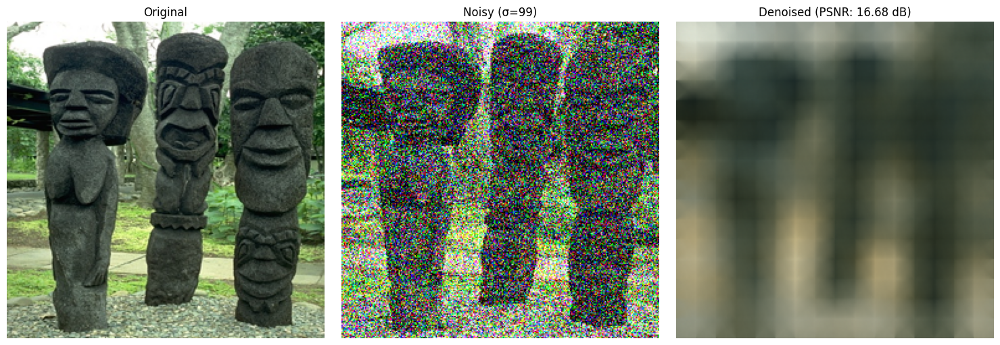

Epoch 11/60 - Loss: 2.0179 (Recon: 2.0179, Curv: 0.0067) - Beta: 0.0010 - Val PSNR: 18.273 dB
Epoch 12/60 - Loss: 2.0103 (Recon: 2.0102, Curv: 0.0074) - Beta: 0.0010 - Val PSNR: 18.278 dB
Epoch 13/60 - Loss: 2.0116 (Recon: 2.0116, Curv: 0.0074) - Beta: 0.0010 - Val PSNR: 18.318 dB
Epoch 14/60 - Loss: 2.0139 (Recon: 2.0138, Curv: 0.0070) - Beta: 0.0010 - Val PSNR: 18.281 dB
Epoch 15/60 - Loss: 2.0041 (Recon: 2.0041, Curv: 0.0071) - Beta: 0.0010 - Val PSNR: 18.342 dB
Epoch 16/60 - Loss: 2.0052 (Recon: 2.0052, Curv: 0.0073) - Beta: 0.0010 - Val PSNR: 18.329 dB
Epoch 17/60 - Loss: 2.0103 (Recon: 2.0103, Curv: 0.0072) - Beta: 0.0010 - Val PSNR: 18.329 dB
Epoch 18/60 - Loss: 2.0005 (Recon: 2.0005, Curv: 0.0078) - Beta: 0.0010 - Val PSNR: 18.345 dB
Epoch 19/60 - Loss: 1.9984 (Recon: 1.9984, Curv: 0.0070) - Beta: 0.0010 - Val PSNR: 18.356 dB
Epoch 20/60 - Loss: 2.0035 (Recon: 2.0035, Curv: 0.0070) - Beta: 0.0010 - Val PSNR: 18.348 dB


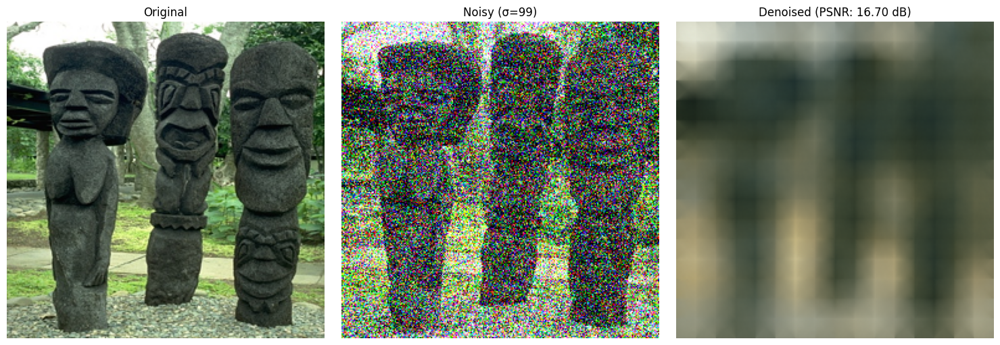

Epoch 21/60 - Loss: 1.9967 (Recon: 1.9967, Curv: 0.0072) - Beta: 0.0010 - Val PSNR: 18.359 dB
Epoch 22/60 - Loss: 1.9948 (Recon: 1.9948, Curv: 0.0072) - Beta: 0.0010 - Val PSNR: 18.370 dB
Epoch 23/60 - Loss: 1.9932 (Recon: 1.9932, Curv: 0.0071) - Beta: 0.0010 - Val PSNR: 18.386 dB
Epoch 24/60 - Loss: 1.9913 (Recon: 1.9913, Curv: 0.0072) - Beta: 0.0010 - Val PSNR: 18.377 dB
Epoch 25/60 - Loss: 1.9914 (Recon: 1.9914, Curv: 0.0072) - Beta: 0.0010 - Val PSNR: 18.393 dB
Epoch 26/60 - Loss: 1.9889 (Recon: 1.9889, Curv: 0.0076) - Beta: 0.0010 - Val PSNR: 18.384 dB
Epoch 27/60 - Loss: 1.9873 (Recon: 1.9873, Curv: 0.0071) - Beta: 0.0010 - Val PSNR: 18.391 dB
Epoch 28/60 - Loss: 1.9857 (Recon: 1.9857, Curv: 0.0072) - Beta: 0.0010 - Val PSNR: 18.396 dB
Epoch 29/60 - Loss: 1.9835 (Recon: 1.9835, Curv: 0.0071) - Beta: 0.0010 - Val PSNR: 18.384 dB
Epoch 30/60 - Loss: 1.9814 (Recon: 1.9814, Curv: 0.0067) - Beta: 0.0010 - Val PSNR: 18.391 dB


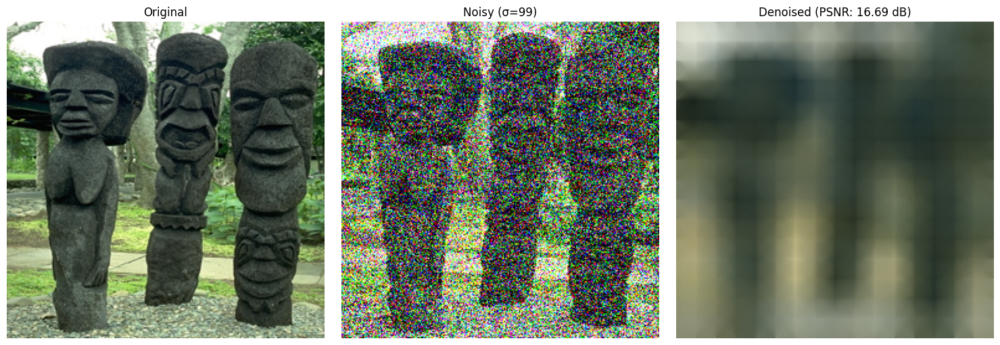

Epoch 31/60 - Loss: 1.9786 (Recon: 1.9786, Curv: 0.0068) - Beta: 0.0010 - Val PSNR: 18.368 dB
Epoch 32/60 - Loss: 1.9786 (Recon: 1.9786, Curv: 0.0070) - Beta: 0.0010 - Val PSNR: 18.334 dB
Epoch 33/60 - Loss: 1.9741 (Recon: 1.9741, Curv: 0.0073) - Beta: 0.0010 - Val PSNR: 18.343 dB
Epoch 34/60 - Loss: 1.9599 (Recon: 1.9599, Curv: 0.0074) - Beta: 0.0010 - Val PSNR: 18.376 dB
Epoch 35/60 - Loss: 1.9469 (Recon: 1.9469, Curv: 0.0075) - Beta: 0.0010 - Val PSNR: 18.462 dB
Epoch 36/60 - Loss: 1.9382 (Recon: 1.9382, Curv: 0.0073) - Beta: 0.0010 - Val PSNR: 18.460 dB
Epoch 37/60 - Loss: 1.9354 (Recon: 1.9354, Curv: 0.0080) - Beta: 0.0010 - Val PSNR: 18.494 dB
Epoch 38/60 - Loss: 1.9322 (Recon: 1.9322, Curv: 0.0073) - Beta: 0.0010 - Val PSNR: 18.506 dB
Epoch 39/60 - Loss: 1.9312 (Recon: 1.9312, Curv: 0.0076) - Beta: 0.0010 - Val PSNR: 18.522 dB
Epoch 40/60 - Loss: 1.9315 (Recon: 1.9315, Curv: 0.0071) - Beta: 0.0010 - Val PSNR: 18.477 dB


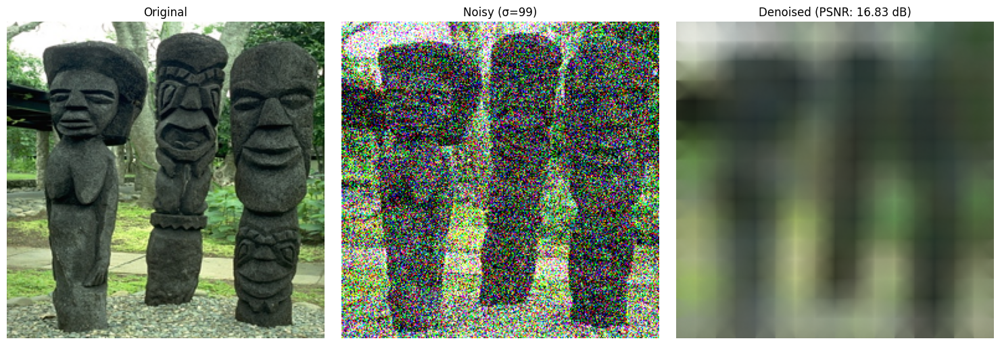

Epoch 41/60 - Loss: 1.9296 (Recon: 1.9296, Curv: 0.0079) - Beta: 0.0010 - Val PSNR: 18.519 dB
Epoch 42/60 - Loss: 1.9284 (Recon: 1.9284, Curv: 0.0079) - Beta: 0.0010 - Val PSNR: 18.511 dB
Epoch 43/60 - Loss: 1.9280 (Recon: 1.9279, Curv: 0.0070) - Beta: 0.0010 - Val PSNR: 18.525 dB
Epoch 44/60 - Loss: 1.9271 (Recon: 1.9271, Curv: 0.0064) - Beta: 0.0010 - Val PSNR: 18.526 dB
Epoch 45/60 - Loss: 1.9274 (Recon: 1.9274, Curv: 0.0068) - Beta: 0.0010 - Val PSNR: 18.517 dB
Epoch 46/60 - Loss: 1.9260 (Recon: 1.9260, Curv: 0.0071) - Beta: 0.0010 - Val PSNR: 18.510 dB
Epoch 47/60 - Loss: 1.9261 (Recon: 1.9261, Curv: 0.0070) - Beta: 0.0010 - Val PSNR: 18.501 dB
Epoch 48/60 - Loss: 1.9250 (Recon: 1.9250, Curv: 0.0070) - Beta: 0.0010 - Val PSNR: 18.523 dB
Epoch 49/60 - Loss: 1.9247 (Recon: 1.9247, Curv: 0.0068) - Beta: 0.0010 - Val PSNR: 18.526 dB
Epoch 50/60 - Loss: 1.9241 (Recon: 1.9240, Curv: 0.0069) - Beta: 0.0010 - Val PSNR: 18.525 dB


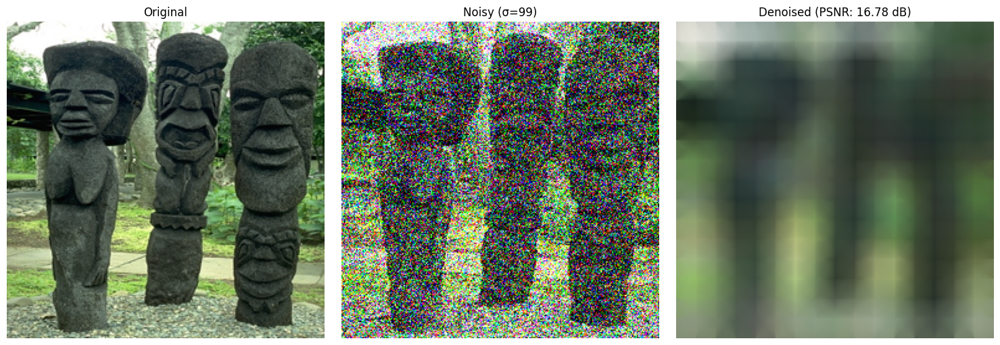

Epoch 51/60 - Loss: 1.9240 (Recon: 1.9240, Curv: 0.0065) - Beta: 0.0010 - Val PSNR: 18.534 dB
Epoch 52/60 - Loss: 1.9237 (Recon: 1.9237, Curv: 0.0070) - Beta: 0.0010 - Val PSNR: 18.519 dB
Epoch 53/60 - Loss: 1.9231 (Recon: 1.9231, Curv: 0.0067) - Beta: 0.0010 - Val PSNR: 18.536 dB
Epoch 54/60 - Loss: 1.9233 (Recon: 1.9233, Curv: 0.0074) - Beta: 0.0010 - Val PSNR: 18.531 dB
Epoch 55/60 - Loss: 1.9229 (Recon: 1.9229, Curv: 0.0069) - Beta: 0.0010 - Val PSNR: 18.526 dB
Epoch 56/60 - Loss: 1.9224 (Recon: 1.9224, Curv: 0.0065) - Beta: 0.0010 - Val PSNR: 18.528 dB
Epoch 57/60 - Loss: 1.9225 (Recon: 1.9225, Curv: 0.0064) - Beta: 0.0010 - Val PSNR: 18.507 dB
Epoch 58/60 - Loss: 1.9226 (Recon: 1.9226, Curv: 0.0065) - Beta: 0.0010 - Val PSNR: 18.523 dB
Epoch 59/60 - Loss: 1.9222 (Recon: 1.9222, Curv: 0.0065) - Beta: 0.0010 - Val PSNR: 18.520 dB
Epoch 60/60 - Loss: 1.9222 (Recon: 1.9222, Curv: 0.0070) - Beta: 0.0010 - Val PSNR: 18.531 dB


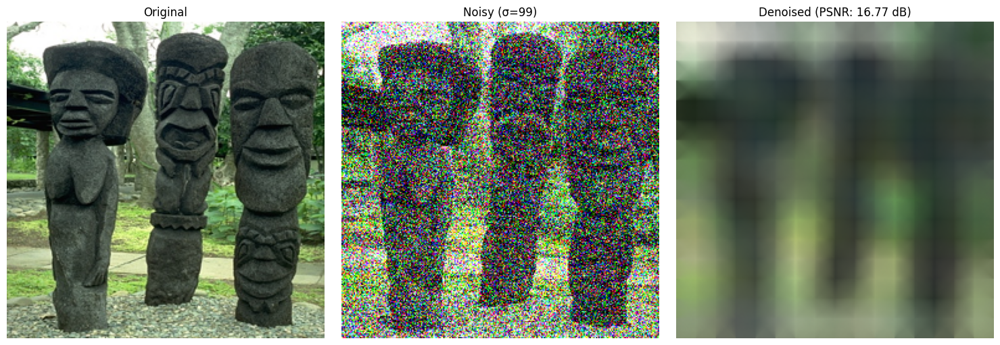

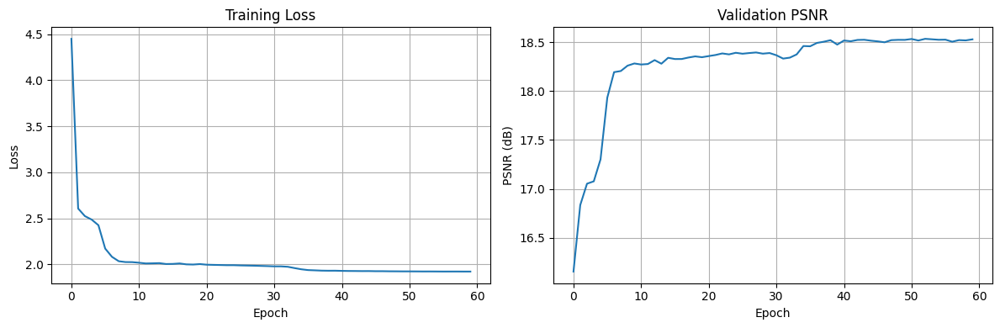


Training complete!
Best validation PSNR: 18.536 dB


In [17]:
print("Enhanced DRF-Net: Ricci Flow Curvature Regularized Denoising")
print("=" * 60)


encoder, recon_head, curvnet, train_losses, val_psnrs = train_enhanced_drf_net(train_imgs, val_imgs, config)

print("\nTraining complete!")
print(f"Best validation PSNR: {max(val_psnrs):.3f} dB")

Evaluating model performance...
Noise σ=15: 24.80 → 16.71 dB (+-8.09 dB)
Noise σ=25: 20.51 → 16.99 dB (+-3.52 dB)
Noise σ=35: 17.79 → 17.34 dB (+-0.44 dB)
Noise σ=50: 15.02 → 17.89 dB (+2.87 dB)


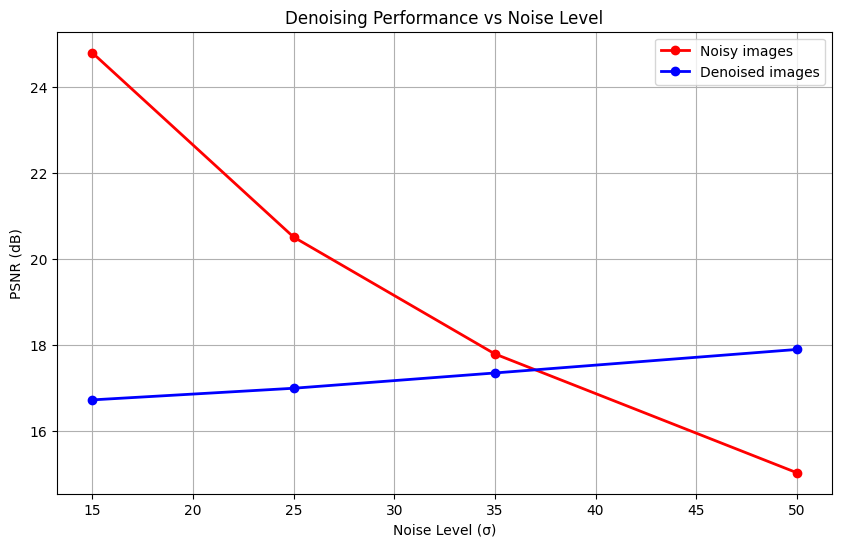

In [19]:
def evaluate_model(encoder, recon_head, test_imgs, config, noise_levels=[15, 25, 35, 50]):
    """Evaluate model performance across different noise levels"""
    encoder.eval()
    recon_head.eval()
    
    results = {}
    
    for sigma in noise_levels:
        psnrs = []
        
        with torch.no_grad():
            for img in test_imgs:
                noisy_img = add_awgn(img, sigma=sigma)
                
                noisy_patches, positions = extract_patches_with_positions(
                    noisy_img, config['patch_size'], config['stride']
                )
                
                if len(noisy_patches) == 0:
                    continue
                
                batch_size = config['batch_size']
                denoised_patches = []
                
                for i in range(0, len(noisy_patches), batch_size):
                    batch_patches = noisy_patches[i:i+batch_size]
                    x_batch = torch.tensor(batch_patches, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
                    
                    probs, features = encoder(x_batch)
                    recon_batch = recon_head(features)
                    
                    denoised_patches.extend(recon_batch.cpu().numpy().transpose(0, 2, 3, 1))
                
                denoised_img = reconstruct_from_patches(
                    denoised_patches, positions, img.shape, 
                    config['patch_size'], config['stride']
                )
                
                img_psnr = psnr(denoised_img, img)
                noisy_psnr = psnr(noisy_img, img)
                psnrs.append((noisy_psnr, img_psnr))
        
        avg_noisy_psnr = np.mean([p[0] for p in psnrs])
        avg_denoised_psnr = np.mean([p[1] for p in psnrs])
        
        results[sigma] = {
            'noisy_psnr': avg_noisy_psnr,
            'denoised_psnr': avg_denoised_psnr,
            'improvement': avg_denoised_psnr - avg_noisy_psnr
        }
        
        print(f"Noise σ={sigma}: {avg_noisy_psnr:.2f} → {avg_denoised_psnr:.2f} dB "
              f"(+{avg_denoised_psnr - avg_noisy_psnr:.2f} dB)")
    
    return results

print("Evaluating model performance...")
evaluation_results = evaluate_model(encoder, recon_head, val_imgs, config)

noise_levels = list(evaluation_results.keys())
noisy_psnrs = [evaluation_results[sigma]['noisy_psnr'] for sigma in noise_levels]
denoised_psnrs = [evaluation_results[sigma]['denoised_psnr'] for sigma in noise_levels]

plt.figure(figsize=(10, 6))
plt.plot(noise_levels, noisy_psnrs, 'r-o', label='Noisy images', linewidth=2)
plt.plot(noise_levels, denoised_psnrs, 'b-o', label='Denoised images', linewidth=2)
plt.xlabel('Noise Level (σ)')
plt.ylabel('PSNR (dB)')
plt.title('Denoising Performance vs Noise Level')
plt.legend()
plt.grid(True)
plt.savefig('outputs/performance_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

Creating comprehensive visualization...


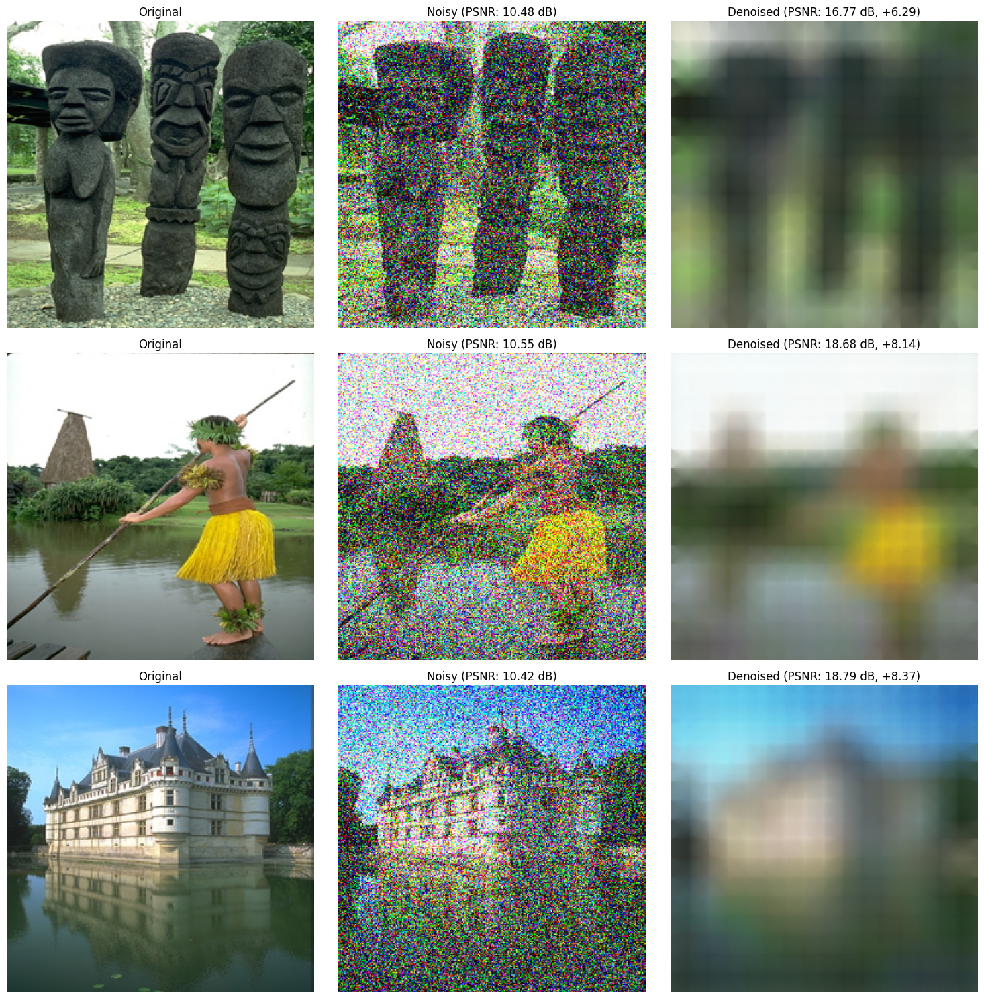

In [21]:
def create_comprehensive_visualization(encoder, recon_head, test_imgs, config):
    """Create a comprehensive visualization of results"""
    encoder.eval()
    recon_head.eval()
    
    fig, axes = plt.subplots(len(test_imgs[:3]), 3, figsize=(15, 5*len(test_imgs[:3])))
    if len(test_imgs[:3]) == 1:
        axes = axes.reshape(1, -1)
    
    with torch.no_grad():
        for idx, img in enumerate(test_imgs[:3]):
            noisy_img = add_awgn(img, sigma=config['noise_sigma'])
            
            noisy_patches, positions = extract_patches_with_positions(
                noisy_img, config['patch_size'], config['stride']
            )
            
            if len(noisy_patches) == 0:
                continue
            
            batch_size = config['batch_size']
            denoised_patches = []
            
            for i in range(0, len(noisy_patches), batch_size):
                batch_patches = noisy_patches[i:i+batch_size]
                x_batch = torch.tensor(batch_patches, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
                
                probs, features = encoder(x_batch)
                recon_batch = recon_head(features)
                
                denoised_patches.extend(recon_batch.cpu().numpy().transpose(0, 2, 3, 1))
            
            denoised_img = reconstruct_from_patches(
                denoised_patches, positions, img.shape, 
                config['patch_size'], config['stride']
            )
            
            axes[idx, 0].imshow(img)
            axes[idx, 0].set_title(f'Original')
            axes[idx, 0].axis('off')
            
            axes[idx, 1].imshow(noisy_img)
            noisy_psnr = psnr(noisy_img, img)
            axes[idx, 1].set_title(f'Noisy (PSNR: {noisy_psnr:.2f} dB)')
            axes[idx, 1].axis('off')
            
            axes[idx, 2].imshow(denoised_img)
            denoised_psnr = psnr(denoised_img, img)
            improvement = denoised_psnr - noisy_psnr
            axes[idx, 2].set_title(f'Denoised (PSNR: {denoised_psnr:.2f} dB, +{improvement:.2f})')
            axes[idx, 2].axis('off')
    
    plt.tight_layout()
    plt.savefig('outputs/comprehensive_results.png', dpi=150, bbox_inches='tight')
    plt.show()

print("Creating comprehensive visualization...")
create_comprehensive_visualization(encoder, recon_head, val_imgs, config)

Analyzing curvature distribution...


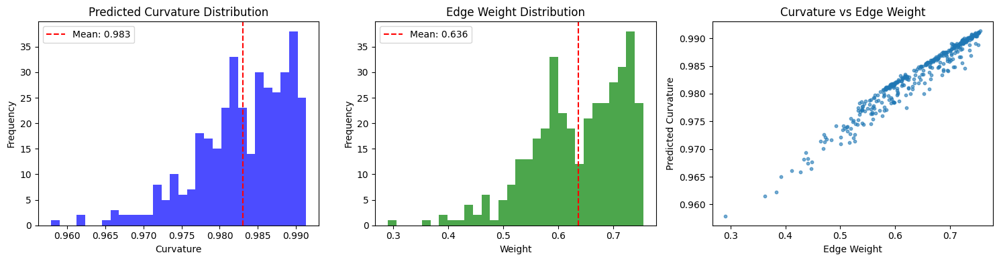

Graph statistics:
  Number of patches: 225
  Number of edges: 370
  Average degree: 3.29
  Curvature range: [0.958, 0.991]
  Mean curvature: 0.983 ± 0.006


In [22]:
def analyze_curvature_distribution(encoder, curvnet, test_img, config):
    """Analyze the distribution of predicted curvatures"""
    encoder.eval()
    curvnet.eval()
    
    with torch.no_grad():
        noisy_img = add_awgn(test_img, sigma=config['noise_sigma'])
        noisy_patches, positions = extract_patches_with_positions(
            noisy_img, config['patch_size'], config['stride']
        )
        
        if len(noisy_patches) == 0:
            return
        
        x = torch.tensor(noisy_patches, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
        probs_torch, features = encoder(x)
        probs = probs_torch.cpu().numpy()
        
        h, w, _ = test_img.shape
        normalized_positions = np.array([(p[0]/h, p[1]/w) for p in positions])
        
        edges, weights_dict = build_better_graph(
            probs, normalized_positions, 
            k=config['k_neighbors'], 
            spatial_sigma=config['spatial_sigma'],
            feature_sigma=config['feature_sigma']
        )
        
        predicted_curvatures = []
        edge_weights = []
        
        for (i, j) in edges:
            hi = probs_torch[i]
            hj = probs_torch[j]
            w = torch.tensor(weights_dict.get((i, j), weights_dict.get((j, i), 1e-6)), 
                           dtype=torch.float32, device=device)
            
            pred_k = curvnet(hi, hj, w)
            predicted_curvatures.append(pred_k.item())
            edge_weights.append(w.item())
        
        fig, axes = plt.subplots(1, 3, figsize=(15, 4))
        
        axes[0].hist(predicted_curvatures, bins=30, alpha=0.7, color='blue')
        axes[0].set_title('Predicted Curvature Distribution')
        axes[0].set_xlabel('Curvature')
        axes[0].set_ylabel('Frequency')
        axes[0].axvline(np.mean(predicted_curvatures), color='red', linestyle='--', 
                       label=f'Mean: {np.mean(predicted_curvatures):.3f}')
        axes[0].legend()
        

        axes[1].hist(edge_weights, bins=30, alpha=0.7, color='green')
        axes[1].set_title('Edge Weight Distribution')
        axes[1].set_xlabel('Weight')
        axes[1].set_ylabel('Frequency')
        axes[1].axvline(np.mean(edge_weights), color='red', linestyle='--',
                       label=f'Mean: {np.mean(edge_weights):.3f}')
        axes[1].legend()
        

        axes[2].scatter(edge_weights, predicted_curvatures, alpha=0.6, s=10)
        axes[2].set_xlabel('Edge Weight')
        axes[2].set_ylabel('Predicted Curvature')
        axes[2].set_title('Curvature vs Edge Weight')
        
        plt.tight_layout()
        plt.savefig('outputs/curvature_analysis.png', dpi=150, bbox_inches='tight')
        plt.show()
        
        print(f"Graph statistics:")
        print(f"  Number of patches: {len(probs)}")
        print(f"  Number of edges: {len(edges)}")
        print(f"  Average degree: {2*len(edges)/len(probs):.2f}")
        print(f"  Curvature range: [{min(predicted_curvatures):.3f}, {max(predicted_curvatures):.3f}]")
        print(f"  Mean curvature: {np.mean(predicted_curvatures):.3f} ± {np.std(predicted_curvatures):.3f}")


print("Analyzing curvature distribution...")
analyze_curvature_distribution(encoder, curvnet, val_imgs[0], config)

In [23]:
def save_complete_model(encoder, recon_head, curvnet, config, filepath='outputs/complete_drf_net.pt'):
    """Save the complete trained model"""
    torch.save({
        'encoder_state_dict': encoder.state_dict(),
        'recon_head_state_dict': recon_head.state_dict(),
        'curvnet_state_dict': curvnet.state_dict(),
        'config': config,
        'model_info': {
            'encoder_params': sum(p.numel() for p in encoder.parameters()),
            'recon_head_params': sum(p.numel() for p in recon_head.parameters()),
            'curvnet_params': sum(p.numel() for p in curvnet.parameters()),
        }
    }, filepath)
    print(f"Complete model saved to {filepath}")

def load_complete_model(filepath='outputs/complete_drf_net.pt'):
    """Load the complete trained model"""
    checkpoint = torch.load(filepath, map_location=device)
    config = checkpoint['config']
    
    encoder = SimpleEncoder(
        patch_size=config['patch_size'],
        n_bins=config['n_bins']
    ).to(device)
    
    recon_head = SimpleReconHead(
        feat_dim=config['feat_dim'],
        patch_size=config['patch_size']
    ).to(device)
    
    curvnet = GraphCurvaturePredictor(
        n_bins=config['n_bins'],
        hidden=config['curv_hidden']
    ).to(device)
    
    # Load state dictionaries
    encoder.load_state_dict(checkpoint['encoder_state_dict'])
    recon_head.load_state_dict(checkpoint['recon_head_state_dict'])
    curvnet.load_state_dict(checkpoint['curvnet_state_dict'])
    
    return encoder, recon_head, curvnet, config


save_complete_model(encoder, recon_head, curvnet, config)

print("Model saved successfully!")
print("\nFinal Summary:")
print("=" * 50)
print(f"✓ Enhanced DRF-Net training completed")
print(f"✓ Best validation PSNR: {max(val_psnrs):.3f} dB")
print(f"✓ Model saved with {sum(p.numel() for p in encoder.parameters()) + sum(p.numel() for p in recon_head.parameters()) + sum(p.numel() for p in curvnet.parameters()):,} total parameters")
print(f"✓ Results and visualizations saved in outputs/ folder")
print("\nKey improvements over previous implementation:")
print("- Simplified encoder architecture")
print("- Better graph construction with spatial constraints")
print("- Reduced curvature regularization weight (beta)")
print("- Dynamic beta adjustment during training")
print("- More training data")

Complete model saved to outputs/complete_drf_net.pt
Model saved successfully!

Final Summary:
✓ Enhanced DRF-Net training completed
✓ Best validation PSNR: 18.536 dB
✓ Model saved with 866,945 total parameters
✓ Results and visualizations saved in outputs/ folder

Key improvements over previous implementation:
- Simplified encoder architecture
- Better graph construction with spatial constraints
- Reduced curvature regularization weight (beta)
- Dynamic beta adjustment during training
- More training data


In [25]:
def denoise_new_image(image_path, encoder, recon_head, config):
    """Denoise a new image using the trained model"""
    img = np.array(Image.open(image_path).convert('RGB'), dtype=np.float32) / 255.0
    
    if img.shape[0] > 512 or img.shape[1] > 512:
        img = np.array(Image.fromarray((img * 255).astype(np.uint8)).resize((512, 512))) / 255.0
    
    noisy_img = add_awgn(img, sigma=25)
    
    encoder.eval()
    recon_head.eval()
    
    with torch.no_grad():
        noisy_patches, positions = extract_patches_with_positions(
            noisy_img, config['patch_size'], config['stride']
        )
        
        batch_size = config['batch_size']
        denoised_patches = []
        
        for i in range(0, len(noisy_patches), batch_size):
            batch_patches = noisy_patches[i:i+batch_size]
            x_batch = torch.tensor(batch_patches, dtype=torch.float32).permute(0, 3, 1, 2).to(device)
            
            probs, features = encoder(x_batch)
            recon_batch = recon_head(features)
            
            denoised_patches.extend(recon_batch.cpu().numpy().transpose(0, 2, 3, 1))
        
        denoised_img = reconstruct_from_patches(
            denoised_patches, positions, img.shape,
            config['patch_size'], config['stride']
        )
    
    return img, noisy_img, denoised_img

print("Enhanced DRF-Net implementation complete!")
print("You can now use denoise_new_image() function to denoise any new image.")

Enhanced DRF-Net implementation complete!
You can now use denoise_new_image() function to denoise any new image.
